# Machine Learning Analysis

For this portion we will take the focused dataset and perform a series of analytical steps to learn about the relationships within the data.

This will take 2 major steps:

1. **Random Forest Classifier** - Each of the categories of charges related to medical conditions will be predicted using a regressive random forest. This will be evaluated on a test set to determine the $R^2$ value of the model. This ensures that the model is is valid for the next step.

2. **MLP Optimum Paring** - The next step is to take a MLP and train it to minimize the output of the random forest given the avg_unemployment by means of controlling the avg_snap. This MLP will then be a function approximator for the ideal SNAP enrollment given the unemployment rate.

In [1]:
percent_expand = .2
snap_min = 1222835 * (1 - percent_expand) 
snap_max = 460000000 * (1 + percent_expand)

unemployment_min = 2.616
unemployment_max = 11.6

In [2]:
print("snap_min: ", snap_min)
print("snap_max: ", snap_max)
print("unemployment_min: ", unemployment_min)
print("unemployment_max: ", unemployment_max)

snap_min:  978268.0
snap_max:  552000000.0
unemployment_min:  2.616
unemployment_max:  11.6


In [73]:
label_titles = [
    '192_CHRONIC_OBSTRUCTIVE_PULMONARY_DISEASE_W/O_CC/MCC',
    '195_SIMPLE_PNEUMONIA_&_PLEURISY_W/O_CC/MCC',
    '292_HEART_FAILURE_&_SHOCK_W_CC',
    '313_CHEST_PAIN',
    '603_CELLULITIS_W/O_MCC',
    '871_SEPTICEMIA_OR_SEVERE_SEPSIS_W/O_MV_96+_HOURS_W_MCC'
]

In [4]:
local_path = './focused_data.csv'

In [24]:
import pandas as pd
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import TensorDataset, DataLoader

# Load your data
data_df = pd.read_csv(local_path)
data_df = data_df.drop(columns=['state', 'year'])

def get_labeled_data(title, dataframe):
    features = dataframe[['avg_snap', 'avg_unemployment']]
    
    #mean = features.mean()
    #std = features.std()
    #features = (features - mean) / std

    target = dataframe[title]
    
    X_train, X_test, y_train, y_test = train_test_split(
        features,
        target,
        test_size=0.08,
        random_state=42  
    )

    return X_train, X_test, y_train, y_test

def get_data_loader(X_train, X_test, y_train, y_test):
    y_train = X_train[['avg_unemployment']]
    y_test = X_test[['avg_unemployment']]
    X_train = X_train[['avg_unemployment']]
    X_test = X_test[['avg_unemployment']]
    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)
    
    # Create TensorDatasets
    train_data = TensorDataset(X_train_tensor, y_train_tensor)
    test_data = TensorDataset(X_test_tensor, y_test_tensor)
    
    # Create DataLoaders
    train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=32, shuffle=True)
    
    return train_loader, test_loader

X_train, X_test, y_train, y_test = get_labeled_data(label_titles[2], data_df)


In [7]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

class Condition_Of_Interest:
    def __init__(self, title, features_train, features_test, target_train, target_test):
        self.title = title
        self.features_train = features_train
        self.features_test = features_test
        self.target_train = target_train
        self.target_test = target_test
        self.random_forest = RandomForestRegressor()

    def train_random_forest(self):
        self.random_forest.fit(self.features_train, self.target_train)

    def get_random_forest_acc(self):
        predictions = self.random_forest.predict(self.features_test)
        return r2_score(self.target_test, predictions)
    
coi = Condition_Of_Interest(label_titles[2], X_train, X_test, y_train, y_test)
coi.train_random_forest()
acc = coi.get_random_forest_acc()
print('Random Forest R^2 Score:', acc)

Random Forest R^2 Score: 0.14528282975732043


In [8]:
print(coi.random_forest.predict([[snap_min, unemployment_min], [snap_max, unemployment_max]]))

[ 6651.02 11183.07]


c:\Users\tomga\anaconda3\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [74]:
dict_of_conditions = {}
for title in label_titles:
    X_train, X_test, y_train, y_test = get_labeled_data(title, data_df)
    dict_of_conditions[title] = Condition_Of_Interest(title, X_train, X_test, y_train, y_test)
    dict_of_conditions[title].train_random_forest()

for title in label_titles:
    acc = dict_of_conditions[title].get_random_forest_acc()
    print(title, 'Random Forest R^2 Score:', acc)

192_CHRONIC_OBSTRUCTIVE_PULMONARY_DISEASE_W/O_CC/MCC Random Forest R^2 Score: -0.8366636243547731
195_SIMPLE_PNEUMONIA_&_PLEURISY_W/O_CC/MCC Random Forest R^2 Score: 0.1649129106108551
292_HEART_FAILURE_&_SHOCK_W_CC Random Forest R^2 Score: 0.3287371643328061
313_CHEST_PAIN Random Forest R^2 Score: -0.021077807438588003
603_CELLULITIS_W/O_MCC Random Forest R^2 Score: 0.05213292029203587
871_SEPTICEMIA_OR_SEVERE_SEPSIS_W/O_MV_96+_HOURS_W_MCC Random Forest R^2 Score: 0.20405954564761353


While these $R^2$ scores are not stellar, this is a complicated system with a lot of noise and unaccounted for variables; so some of these are actually very reasonable.
We will discard the models with negative $R^2$ scores, as they are clearly worse than a simple mean model.

In [11]:
coi = dict_of_conditions[label_titles[2]]
print(coi.random_forest.predict([[snap_min, unemployment_min], [snap_max, unemployment_max]]))

[ 6556.51 11183.52]


c:\Users\tomga\anaconda3\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [12]:
label_titles = [
    '195_SIMPLE_PNEUMONIA_&_PLEURISY_W/O_CC/MCC',
    '292_HEART_FAILURE_&_SHOCK_W_CC',
    '603_CELLULITIS_W/O_MCC',
    '871_SEPTICEMIA_OR_SEVERE_SEPSIS_W/O_MV_96+_HOURS_W_MCC'
]

dict_of_conditions.pop('192_CHRONIC_OBSTRUCTIVE_PULMONARY_DISEASE_W/O_CC/MCC')
dict_of_conditions.pop('313_CHEST_PAIN')

Here we choose a simple MLP network with 2 hidden layers, as the job of this network is to approximate a simple real valued function of a single variable.

We don't want the network to predict values of snap that are unrealistic or impossible. As a result, we add a penalty term that bounds the output within the range of SNAP enrollment values in the dataset expanded by a margin.
This is accomplished by inverting a bump function and multiplying it by some undesirable constant.

In [63]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

class SnapMLP(nn.Module):
    def __init__(self, random_forest, snap_min, snap_max, unemployment_min, unemployment_max, sharpness=10):
        super(SnapMLP, self).__init__()

        self.random_forest = random_forest
        self.snap_min = snap_min
        self.snap_max = snap_max
        self.unemployment_min = unemployment_min
        self.unemployment_max = unemployment_max
        self.sharpness = sharpness

        self.fc1 = nn.Linear(1, 60)
        self.fc2 = nn.Linear(60, 60)
        self.fc3 = nn.Linear(60, 1)
        self.dropout = nn.Dropout(0.2)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
    def inverted_bump(self, x):
        left_wall = torch.sigmoid(self.sharpness * (x - self.snap_min))
        right_wall = torch.sigmoid(self.sharpness * -(x - self.snap_max))
        bump = left_wall * right_wall
        return -bump + 1
    
    def custom_loss(self, predictions, targets):
        combined = torch.cat((predictions, targets), dim=1).detach().numpy()
        rf_loss = self.random_forest.predict(combined)
        rf_loss = torch.tensor(rf_loss, dtype=torch.float32)
        
        bump_penalty = self.inverted_bump(predictions) * 1
        total_loss = rf_loss + bump_penalty
        return total_loss.mean()

def train(model, train_loader, optimizer, epochs=500):
    for epoch in range(epochs):
        model.train()
        for batch_idx, (data, target) in enumerate(train_loader):
            optimizer.zero_grad()
            data.requires_grad = True
            predictions = model(data)
            loss = model.custom_loss(predictions, target)
            loss.backward()
            optimizer.step()
            if epoch % 100 == 0:
                print(f'Epoch {epoch}, Batch {batch_idx}, Loss {loss.item()}')

import warnings
warnings.filterwarnings("ignore")


In order to avoid dead gradients in the extreams of the bump function, we first pretrain the network to approximate the constant function of the average SNAP enrollment.

In [49]:
def train_to_constant(model, train_loader,optimizer, target, epochs=500):
    for epoch in range(epochs):
    #while True:
        model.train()
        for batch_idx, (data, _) in enumerate(train_loader):
            optimizer.zero_grad()
            data.requires_grad = True
            #print(data.shape)
            predictions = model(data)
            print(predictions)
            loss = F.mse_loss(predictions, target)
            loss.backward()
            optimizer.step()
            if loss.item() < 1:
                break

middle_snap = (snap_max + snap_min) / 2

In [64]:
mlp = SnapMLP(dict_of_conditions[label_titles[3]].random_forest, snap_min, snap_max, unemployment_min, unemployment_max)
train_loader, test_loader = get_data_loader(*get_labeled_data(label_titles[3], data_df))
optimizer = optim.Adam(mlp.parameters(), lr=0.1)
train_to_constant(mlp, train_loader, optimizer, torch.tensor([middle_snap] * 32, dtype=torch.float32))
optimizer = optim.Adam(mlp.parameters(), lr=0.05)
train(mlp, train_loader, optimizer, epochs=1000)

tensor([[ 0.2453],
        [ 0.3953],
        [-0.0618],
        [-0.3068],
        [ 0.5210],
        [ 0.5548],
        [ 0.5290],
        [-0.1157],
        [-0.0944],
        [ 0.3382],
        [ 0.3024],
        [ 0.5944],
        [ 0.1552],
        [ 0.0650],
        [ 0.9592],
        [ 1.1494],
        [ 0.2011],
        [ 0.5469],
        [ 0.2067],
        [ 0.3620],
        [ 0.3460],
        [ 0.3434],
        [-0.1814],
        [ 0.1493],
        [ 0.4186],
        [ 0.5044],
        [ 0.1659],
        [-0.0466],
        [ 0.3532],
        [ 0.2954],
        [ 0.8305],
        [ 0.1578]], grad_fn=<AddmmBackward0>)
tensor([[31.8044],
        [48.7959],
        [51.3054],
        [76.4308],
        [36.6878],
        [30.6258],
        [50.6493],
        [48.2338],
        [54.2145],
        [37.3995],
        [29.7970],
        [42.8705],
        [39.5309],
        [37.9731],
        [18.2309],
        [36.0381],
        [36.4710],
        [48.2849],
        [49.8683],
    

In [57]:
p = mlp(torch.tensor([[unemployment_max]], dtype=torch.float32))
print(p.item())

424505600.0


Now that we have a network trained for each of the categories, it effectively acts as a function approximator for the ideal SNAP enrollment given the unemployment rate.

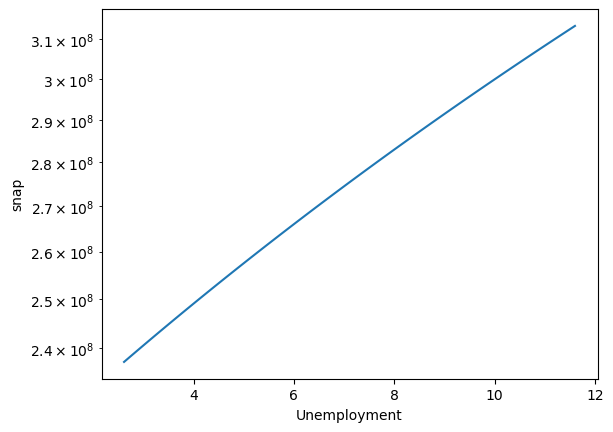

In [65]:
import matplotlib.pyplot as plt

mlp.eval()
unemployment = np.linspace(unemployment_min, unemployment_max, 100)
X = torch.tensor(unemployment, dtype=torch.float32).unsqueeze(1)
predictions = mlp(X).detach().numpy()

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(unemployment, predictions)
#log scale
ax.set_yscale('log')
ax.set_xlabel('Unemployment')
ax.set_ylabel('snap')

plt.show()

tensor([[0.6346],
        [1.2868],
        [1.0130],
        [0.6414],
        [0.6658],
        [1.1750],
        [0.9494],
        [1.7207],
        [1.0714],
        [0.6652],
        [1.1058],
        [0.8709],
        [0.6864],
        [1.2023],
        [1.2434],
        [0.6143],
        [0.8704],
        [1.3166],
        [1.5031],
        [0.6083],
        [1.7550],
        [0.6865],
        [0.8242],
        [0.4519],
        [0.7508],
        [1.2935],
        [1.2880],
        [0.4324],
        [0.7025],
        [0.4608],
        [1.3574],
        [0.7342]], grad_fn=<AddmmBackward0>)
tensor([[63.1400],
        [71.5919],
        [59.5922],
        [35.7028],
        [54.9442],
        [72.0457],
        [64.8980],
        [37.1692],
        [50.4526],
        [46.7296],
        [55.9545],
        [49.5470],
        [60.4995],
        [57.2454],
        [54.2442],
        [60.2945],
        [64.1419],
        [71.1355],
        [56.5888],
        [53.9458],
        [62.7590]

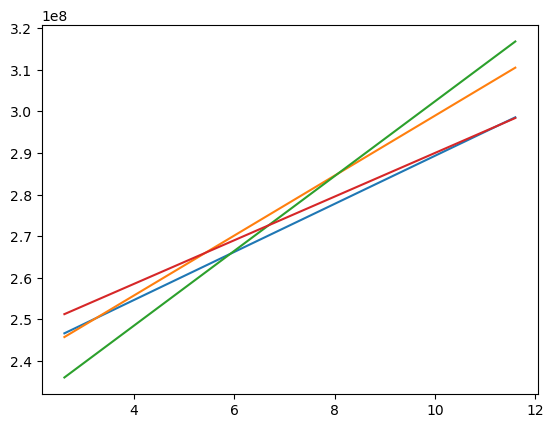

In [66]:
mlps = {}
for title in label_titles:
    mlp = SnapMLP(dict_of_conditions[title].random_forest, snap_min, snap_max, unemployment_min, unemployment_max)
    train_loader, test_loader = get_data_loader(*get_labeled_data(title, data_df))
    optimizer = optim.Adam(mlp.parameters(), lr=0.1)
    train_to_constant(mlp, train_loader, optimizer, torch.tensor([middle_snap] * 32, dtype=torch.float32))
    optimizer = optim.Adam(mlp.parameters(), lr=0.05)
    train(mlp, train_loader, optimizer, epochs=1000)
    mlps[title] = mlp

for title in label_titles:
    mlp = mlps[title]
    mlp.eval()
    unemployment = np.linspace(unemployment_min, unemployment_max, 100)
    X = torch.tensor(unemployment, dtype=torch.float32).unsqueeze(1)
    predictions = mlp(X).detach().numpy()
    # legend
    plt.plot(unemployment, predictions, label=title)


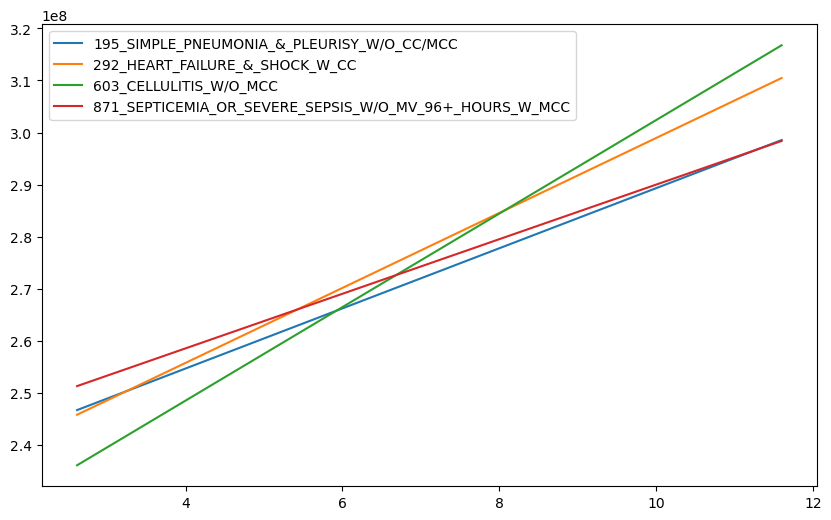

In [71]:
plt.figure(figsize=(10, 6))
for title in label_titles:
    mlp = mlps[title]
    mlp.eval()
    unemployment = np.linspace(unemployment_min, unemployment_max, 100)
    X = torch.tensor(unemployment, dtype=torch.float32).unsqueeze(1)
    predictions = mlp(X).detach().numpy()
    plt.plot(unemployment, predictions, label=title)

plt.legend()
plt.show()